# 專案簡介

這個專案旨在利用 Mask R-CNN 模型來進行植物葉片的分割，主要目的是識別並分割圖像中的植物葉片。該專案涉及到數據讀取、模型訓練、結果視覺化等步驟，並使用 GPU 加速以提高訓練效率。以下是這個專案的詳細說明。

# 資料讀取和顯示

首先，專案從指定的目錄中讀取訓練資料。這些資料包括 RGB 圖片和相應的標籤圖片。會檢查這些文件是否存在然後再顯示它們。RGB 圖片用於展示原始圖像，標籤圖片則用來確認唯一值，以確定是否有葉片的註釋。如果標籤圖片中只有一個唯一值（即全黑），則表示該圖片中沒有任何葉片的註釋，否則，則包含葉片註釋。

# 模型仔入和訓練

接下來，專案加載預訓練的 Mask R-CNN 模型，並修改其類別數量，以適應植物葉片分割任務。具體來說，預訓練模型的分類器被重新定義為可以處理兩個類別：背景和葉片。這個模型被加載到 GPU 上以利用其計算能力。

在訓練過程中，模型的參數會被優化，並且每個 epoch 的損失值會被記錄下來。這些損失值用於監控模型的訓練進展。整個訓練過程會計時，以估算總的訓練時間。訓練完成後，會顯示每個 epoch 的平均損失值，並生成損失值的圖表。

# 數據集定義和測試

專案定義了一個自定義的數據集類別 LeafDataset，該類別用於從資料夾中讀取圖像和標籤，並進行必要的數據轉換。數據集類別實現了 PyTorch 的 Dataset 介面，可以方便地與 DataLoader 結合使用，從而實現數據的批量加載。

在測試階段，隨機選擇幾張圖片進行模型推理。這些測試圖片經過預處理後，被送入模型進行分割。分割結果將會與原始圖片一起顯示，並保存到指定的路徑。

# 結果視覺化

為了更直觀地展示分割結果，專案定義了一組顏色，用於標記不同的葉片。在結果視覺化步驟中，分割結果會與原圖一起顯示。這樣可以清楚地看到模型的分割效果，每個葉片會被標記成不同的顏色，使得結果更容易理解。

# 保存模型和圖表

最後，專案會保存訓練好的模型的狀態字典，以便後續使用。同時，訓練過程中記錄的損失值圖表也會保存下來，這樣可以方便地查看模型的訓練進展和效果。

***註：註解是我叫 ChatGPT 幫我加上去的***




# 效果

![效果圖](result/segmentation_result_1_20240530_234508.png)

![Training Loss per Epoch](result/100_training_loss_20240530_234508.png)



# 掛載 Google Drive

這個作業我是放在 Google Colab 上面完成的，因此我將測試的圖片都放在 Google Drive 裡面。

In [1]:
# 掛載 Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 設置資料路徑
data_dir = '/content/drive/My Drive/A1/'

Mounted at /content/drive


# Import 套件

In [14]:
import os
import time
import random
from datetime import datetime

import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.transforms as T
from torchvision.models.detection import MaskRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.ops import box_iou

import matplotlib.pyplot as plt
from PIL import Image

num_epochs = ""

# 讀取和顯示訓練資料中的 RGB 圖片和標籤圖片，並檢查標籤圖片中的唯一值，以確認是否有葉子的註釋。

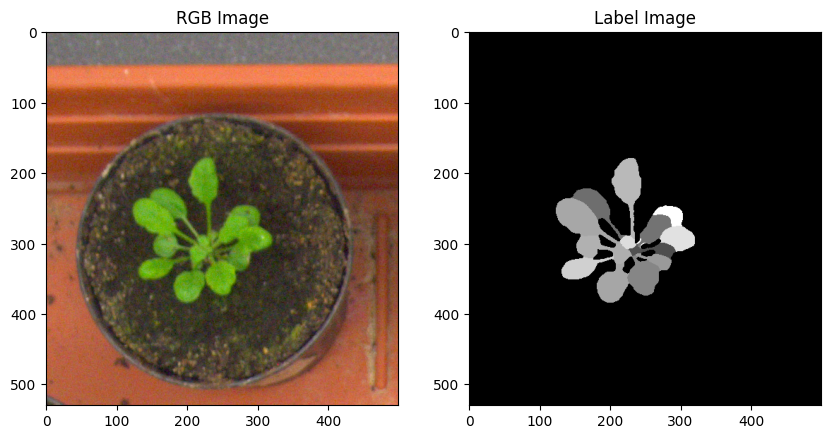

Unique values in label image: [  0  68  70  95 100 116 133 144 145 151 153 160 180 191 195 221]
The label image contains leaf annotations.


In [3]:
# 訓練資料的目錄
data_dir = '/content/drive/My Drive/A1/'

# 讀取圖片
rgb_image_path = os.path.join(data_dir, 'plant001_rgb.png')
label_image_path = os.path.join(data_dir, 'plant001_label.png')

# 檢查文件是否存在
if not os.path.exists(rgb_image_path) or not os.path.exists(label_image_path):
    print(f"Error: One or both files not found: {rgb_image_path}, {label_image_path}")
else:
    rgb_image = Image.open(rgb_image_path).convert("RGB")
    label_image = Image.open(label_image_path).convert("L")

    # 顯示 RGB 圖片
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(rgb_image)
    plt.title('RGB Image')

    # 顯示標籤圖片
    plt.subplot(1, 2, 2)
    plt.imshow(label_image, cmap='gray')
    plt.title('Label Image')

    plt.show()

    # 打印唯一值
    label_np = np.array(label_image)
    unique_values = np.unique(label_np)
    print(f"Unique values in label image: {unique_values}")

    # 檢查標籤圖像的唯一值是否存在問題
    if unique_values.size == 1 and unique_values[0] == 0:
        print("The label image does not contain any leaf annotations.")
    else:
        print("The label image contains leaf annotations.")


# 加載預訓練的 Mask R-CNN 模型
這段程式碼主要用於加載一個預訓練的 Mask R-CNN 模型，定義類別數量，並將模型移動到 GPU 上。



In [4]:
# 加載預訓練的 Mask R-CNN 模型
def get_model_instance_segmentation(num_classes):
    # 加載預訓練的 Mask R-CNN 模型
    backbone = resnet_fpn_backbone('resnet50', pretrained=True)
    model = MaskRCNN(backbone, num_classes=num_classes)

    return model

# 定義類別數量（包括背景）
num_classes = 2  # 1 class (leaf) + 1 background

# 獲取模型
model = get_model_instance_segmentation(num_classes)

# 移動模型到 GPU
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

# 檢查模型結構
# print(model)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=1e-05)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=1e-05)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=1e-05)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=1e-05)
          (relu):

# 加載最新訓練的模型
這段程式碼主要用於查找並加載模型資料夾中最新的模型文件，並將其移動到 GPU 上進行推論。



In [5]:
# 模型的路徑
model_dir = '/content/drive/My Drive/ML_Class/Model/'

# 查找模型資料夾中最新的模型文件
model_files = [f for f in os.listdir(model_dir) if f.endswith('.pth')]
latest_model_file = max(model_files, key=lambda f: os.path.getctime(os.path.join(model_dir, f)))
latest_model_path = os.path.join(model_dir, latest_model_file)

# 加載最新的模型
model = get_model_instance_segmentation(num_classes)
model.load_state_dict(torch.load(latest_model_path))
model.to(device)
model.eval()
print(f"Model loaded from {latest_model_path}")

Model loaded from /content/drive/My Drive/ML_Class/Model/mask_rcnn_model_20240530_234508.pth


# 視覺化分割結果並測試模型
這段程式碼主要用於定義顏色、視覺化模型的分割結果，並隨機測試模型在圖片上的表現。



In [6]:
# 定義顏色
colors = [
    (255, 0, 0),  # Red
    (0, 255, 0),  # Green
    (0, 0, 255),  # Blue
    (255, 255, 0),  # Yellow
    (0, 255, 255),  # Cyan
    (255, 0, 255),  # Magenta
    (192, 192, 192),  # Silver
    (128, 0, 128),  # Purple
    (128, 128, 0),  # Olive
    (0, 128, 128)  # Teal
]

def visualize_predictions(original_image, masks, save_path=None):
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    # 顯示原圖
    axes[0].imshow(original_image.permute(1, 2, 0).cpu().numpy())
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # 顯示分割結果
    result_image = original_image.permute(1, 2, 0).cpu().numpy().copy()
    num_masks = masks.shape[0]

    if num_masks > len(colors):
        color_cycle = colors * (num_masks // len(colors)) + colors[:num_masks % len(colors)]
    else:
        color_cycle = colors[:num_masks]

    for i, color in zip(range(num_masks), color_cycle):
        mask = masks[i].cpu().numpy()
        result_image[mask == 1] = color

    axes[1].imshow(result_image)
    axes[1].set_title('Segmentation Result')
    axes[1].axis('off')

    if save_path:
        plt.savefig(save_path)
    plt.show()

def test_model_on_images(model, device, data_dir, num_images=5, save_images=False, chart_dir=None):
    # 獲取資料夾中所有的圖片檔名
    image_files = [f for f in os.listdir(data_dir) if f.endswith('_rgb.png')]
    image_files.sort()  # 確保有序

    # 加載已訓練好的模型
    model.eval()
    model.to(device)

    # 隨機選擇圖片進行測試
    for i in range(num_images):
        while True:
            idx = random.randint(1, 161)
            test_image_path = os.path.join(data_dir, f'plant{idx:03d}_rgb.png')
            if os.path.exists(test_image_path):
                break
            else:
                print(f"Image plant{idx:03d}_rgb.png not found. Picking another one...")

        # 讀取測試圖片
        test_image = Image.open(test_image_path).convert("RGB")
        transform = T.Compose([T.ToTensor()])
        test_image_tensor = transform(test_image).to(device)

        # 切換到評估模式
        model.eval()

        # 模型推理
        with torch.no_grad():
            prediction = model([test_image_tensor])

        # 提取分割結果
        masks = prediction[0]['masks'] > 0.5  # Thresholding at 0.5
        masks = masks.squeeze(1)  # Remove the channel dimension

        # 定義保存分割結果的路徑
        current_time = datetime.now().strftime('%Y%m%d_%H%M%S')
        result_save_path = os.path.join(chart_dir, f'segmentation_result_{i+1}_{current_time}.png') if save_images and chart_dir else None

        # 可視化分割結果
        visualize_predictions(test_image_tensor, masks, save_path=result_save_path)

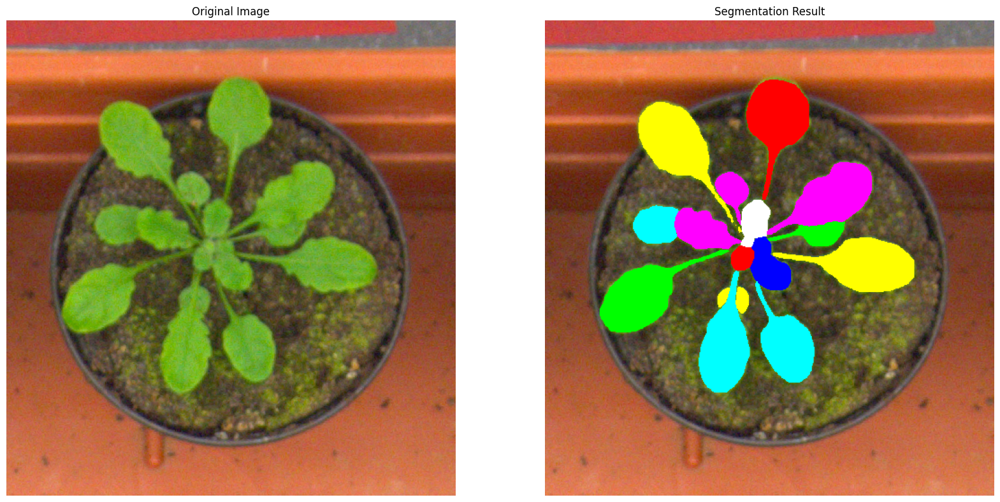

Image plant003_rgb.png not found. Picking another one...


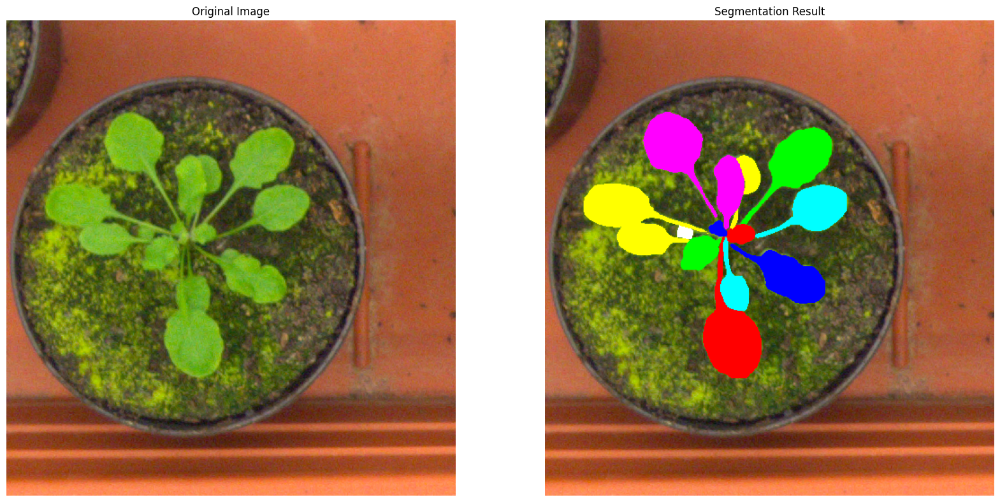

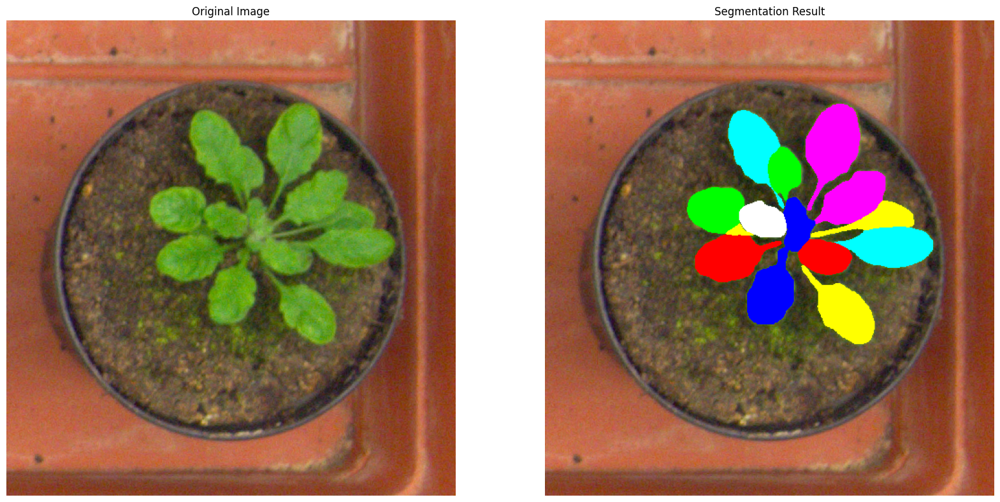

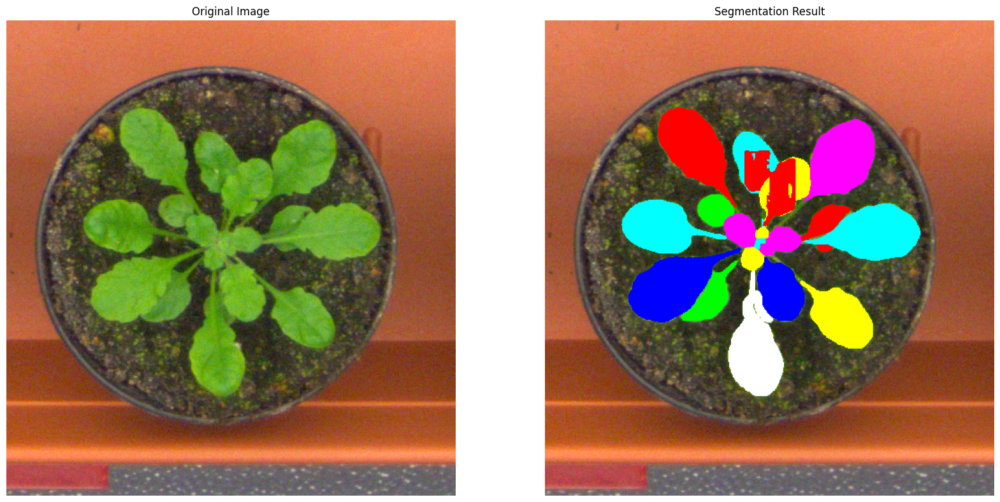

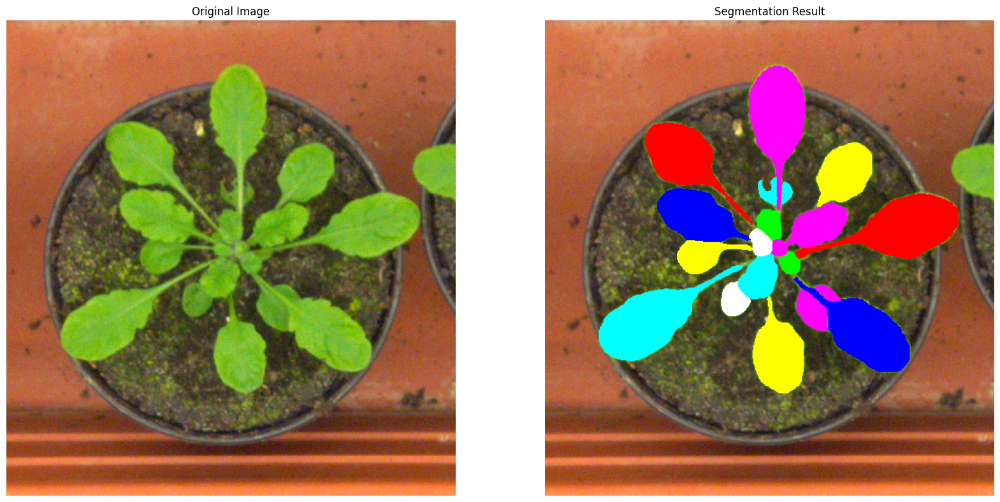

In [7]:
# 只測試模型，不儲存圖片
test_model_on_images(model, device, data_dir, num_images=5, save_images=False)

# # 儲存圖片
# test_model_on_images(model, device, data_dir, num_images=5, save_images=True, chart_dir=chart_dir)



---

# 訓練模型

# 自定義數據集類別並測試數據加載
這段程式碼主要用於定義一個自定義的數據集類別 `LeafDataset`，並使用 DataLoader 加載和測試數據集中的圖像和標籤。

In [ ]:
class LeafDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.file_names = [f.split('_')[0] for f in os.listdir(root_dir) if f.endswith('_rgb.png')]

    def __len__(self):
        return len(self.file_names)

    def __getitem__(self, idx):
        img_name = os.path.join(self.root_dir, self.file_names[idx] + '_rgb.png')
        label_name = os.path.join(self.root_dir, self.file_names[idx] + '_label.png')

        if not os.path.exists(img_name) or not os.path.exists(label_name):
            print(f"Error: One or both files not found: {img_name}, {label_name}")
            return None

        image = Image.open(img_name).convert("RGB")
        label = Image.open(label_name).convert("L")

        label_np = np.array(label)
        if self.transform:
            image = self.transform(image)

        label_tensor = torch.tensor(label_np, dtype=torch.int64)
        unique_values_post_transform = torch.unique(label_tensor)
        # print(f"Unique values in transformed label image: {unique_values_post_transform}")

        if unique_values_post_transform.size(0) == 1 and unique_values_post_transform[0] == 0:
            masks = torch.zeros((1, label_tensor.shape[0], label_tensor.shape[1]), dtype=torch.uint8)
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            masks = label_tensor > 0
            masks = masks.to(torch.uint8).unsqueeze(0)

            obj_ids = torch.unique(label_tensor)
            obj_ids = obj_ids[1:]
            num_objs = len(obj_ids)

            boxes = []
            for i in obj_ids:
                pos = torch.where(label_tensor == i)
                xmin = torch.min(pos[1])
                xmax = torch.max(pos[1])
                ymin = torch.min(pos[0])
                ymax = torch.max(pos[0])
                if xmax > xmin and ymax > ymin:  # 過濾無效的邊界框
                    boxes.append([xmin, ymin, xmax, ymax])

            if len(boxes) == 0:
                boxes = torch.zeros((0, 4), dtype=torch.float32)
                labels = torch.zeros((0,), dtype=torch.int64)
            else:
                boxes = torch.as_tensor(boxes, dtype=torch.float32)
                labels = torch.ones((len(boxes),), dtype=torch.int64)

            masks = torch.stack([label_tensor == i for i in obj_ids if torch.any(label_tensor == i)], dim=0).to(torch.uint8)

        target = {
            'boxes': boxes,
            'labels': labels,
            'masks': masks
        }

        return image, target

def collate_fn(batch):
    images = [item[0] for item in batch]
    targets = [item[1] for item in batch]
    return images, targets

data_transform = transforms.Compose([
    transforms.ToTensor()
])

leaf_dataset = LeafDataset(root_dir=data_dir, transform=data_transform)
data_loader = DataLoader(leaf_dataset, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)

data_iter = iter(data_loader)
images, targets = next(data_iter)

print(f'Batch size: {len(images)}')
print(f'Image shape: {images[0].shape}')
print(f'Targets: {targets}')

for i, target in enumerate(targets):
    print(f"Target {i}: {type(target)}")
    if isinstance(target, dict):
        for key, value in target.items():
            print(f"  {key}: {value.shape if isinstance(value, torch.Tensor) else value}")
    else:
        print(f"Unexpected type: {target}")

Batch size: 2
Image shape: torch.Size([3, 530, 500])
Targets: [{'boxes': tensor([[114., 331., 213., 421.],
        [287., 279., 363., 327.],
        [177., 191., 231., 291.],
        [267., 310., 299., 344.],
        [ 73., 200., 176., 284.],
        [238., 301., 287., 337.],
        [212., 307., 240., 337.],
        [170., 280., 221., 319.],
        [210., 148., 271., 278.],
        [219., 271., 260., 313.],
        [108., 325., 213., 387.],
        [252., 193., 380., 303.],
        [157., 292., 189., 327.],
        [228., 324., 299., 427.],
        [155., 227., 222., 295.],
        [196., 337., 237., 402.],
        [263., 249., 305., 295.]]), 'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]), 'masks': tensor([[[0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         ...,
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0],
         [0, 0, 0,  ..., 0, 0, 0]],

        [[0, 0, 0,  ..., 0, 0, 0],
      

# 訓練 Mask R-CNN 模型
這段程式碼主要用於訓練一個修改過類別數量的預訓練 Mask R-CNN 模型，並記錄每個 epoch 的損失。

Epoch: 0, Average Loss: 1.277864035218954
Epoch: 1, Average Loss: 0.8495172569528222
Epoch: 2, Average Loss: 0.6856800373643637
Epoch: 3, Average Loss: 0.6084934873506427
Epoch: 4, Average Loss: 0.5343513293191791
Epoch: 5, Average Loss: 0.4910781104117632
Epoch: 6, Average Loss: 0.45322768203914165
Epoch: 7, Average Loss: 0.4187063346616924
Epoch: 8, Average Loss: 0.38538840133696795
Epoch: 9, Average Loss: 0.3698559571057558
Epoch: 10, Average Loss: 0.3442666595801711
Epoch: 11, Average Loss: 0.3325123144313693
Epoch: 12, Average Loss: 0.3175193602219224
Epoch: 13, Average Loss: 0.3052194269839674
Epoch: 14, Average Loss: 0.29303303617052734
Epoch: 15, Average Loss: 0.28228565608151257
Epoch: 16, Average Loss: 0.2792954451870173
Epoch: 17, Average Loss: 0.2710800583008677
Epoch: 18, Average Loss: 0.26227424480021
Epoch: 19, Average Loss: 0.25625576777383685
Epoch: 20, Average Loss: 0.25249779410660267
Epoch: 21, Average Loss: 0.25597092416137457
Epoch: 22, Average Loss: 0.24544625729

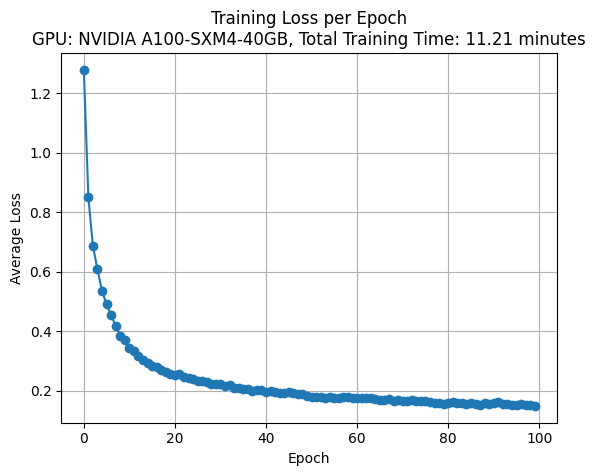

In [ ]:
# 加載預訓練的 Mask R-CNN 模型並修改類別數量
def get_model_instance_segmentation(num_classes):
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(in_features_mask, hidden_layer, num_classes)
    return model

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
gpu_name = torch.cuda.get_device_name(device) if torch.cuda.is_available() else 'CPU'
num_classes = 2
model = get_model_instance_segmentation(num_classes)
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)
num_epochs = 100

# 紀錄每個 epoch 的損失
losses_per_epoch = []

# 開始計時
start_time = time.time()

for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    i = 0
    for images, targets in data_loader:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        epoch_loss += losses.item()
        # print(f"Epoch: {epoch}, Batch: {i}, Loss: {losses.item()}")
        i += 1

    avg_epoch_loss = epoch_loss / len(data_loader)
    losses_per_epoch.append(avg_epoch_loss)
    print(f"Epoch: {epoch}, Average Loss: {avg_epoch_loss}")

# 訓練結束計時
end_time = time.time()
total_training_time = end_time - start_time

print("Training completed!")

# 顯示每個 epoch 的平均 loss 圖表
plt.figure()
plt.plot(range(num_epochs), losses_per_epoch, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title(f'Training Loss per Epoch\nGPU: {gpu_name}, Total Training Time: {total_training_time/60:.2f} minutes')
plt.grid(True)
plt.show()


# 保存模型和訓練損失圖表
這段程式碼主要用於使用當前時間作為文件名保存訓練好的模型和損失圖表，並創建必要的目錄。



In [15]:
# 使用當前時間作為模型文件名
current_time = datetime.now().strftime('%Y%m%d_%H%M%S')

# 定義保存模型的路徑
model_dir = '/content/drive/My Drive/ML_Class/Model/'
chart_dir = f'/content/drive/My Drive/ML_Class/Charts/{num_epochs}_{current_time}/'

# 如果路徑不存在，創建該路徑
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
if not os.path.exists(chart_dir):
    os.makedirs(chart_dir)

model_save_path = os.path.join(model_dir, f'mask_rcnn_model_{current_time}.pth')
chart_save_path = os.path.join(chart_dir, f'{num_epochs}_training_loss_{current_time}.png')

# 測試模型並且儲存圖片

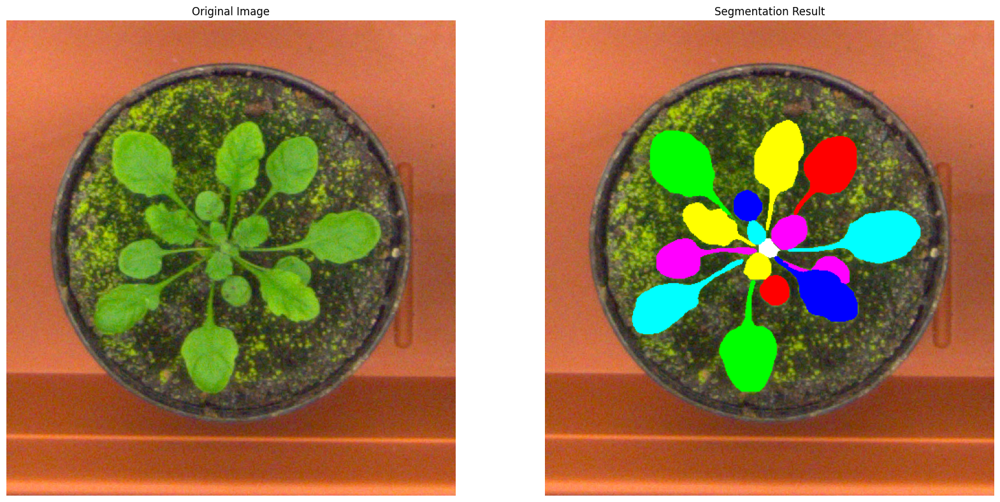

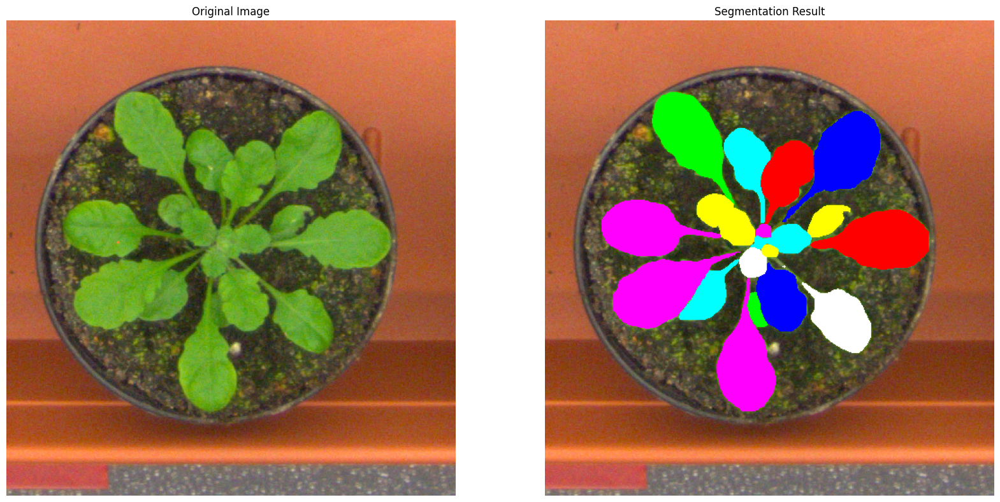

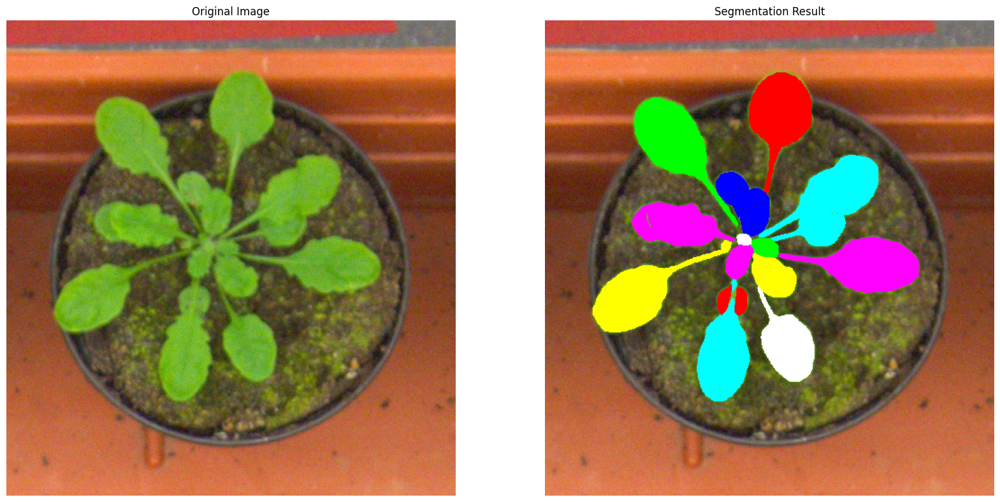

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


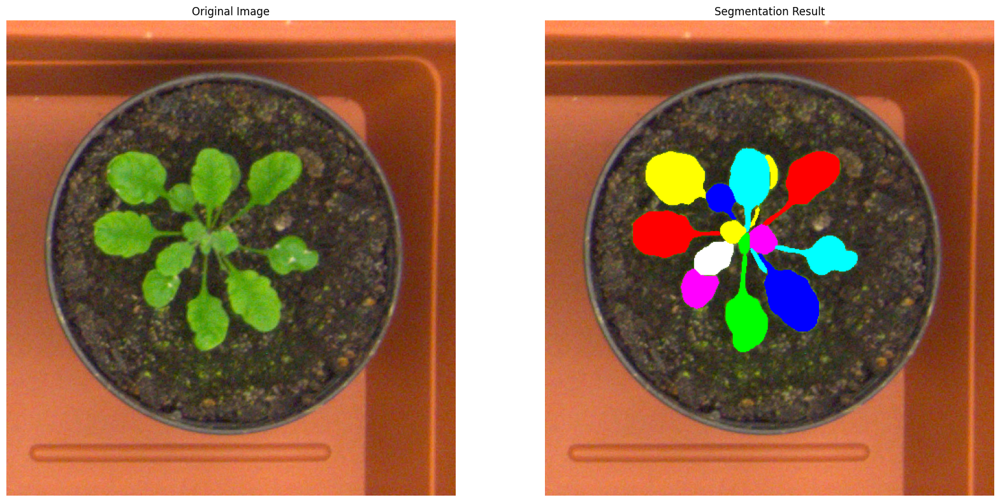

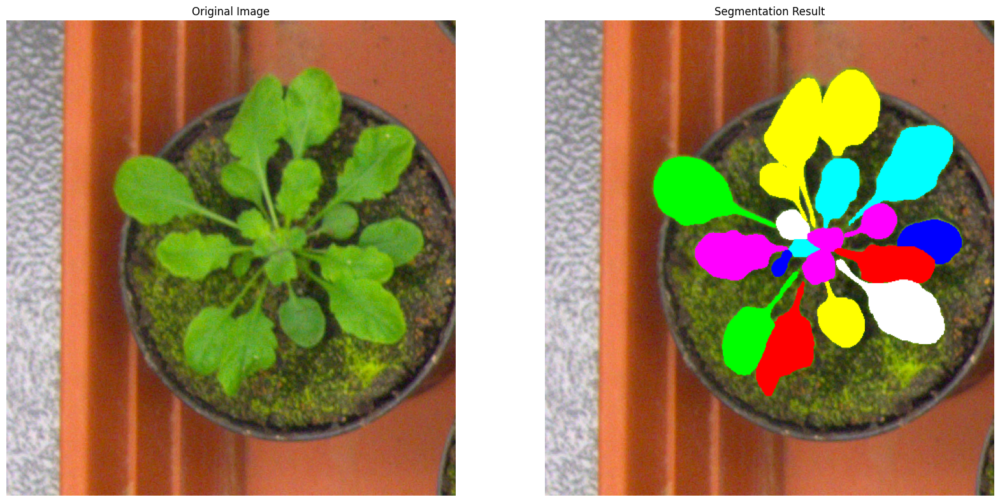

In [16]:
test_model_on_images(model, device, data_dir, num_images=5, save_images=True, chart_dir=chart_dir)

# 保存模型和訓練損失圖表
這段程式碼主要用於保存訓練好的模型的狀態字典，並顯示和保存每個 epoch 的平均損失圖表。



Model saved to /content/drive/My Drive/ML_Class/Model/mask_rcnn_model_20240530_234508.pth


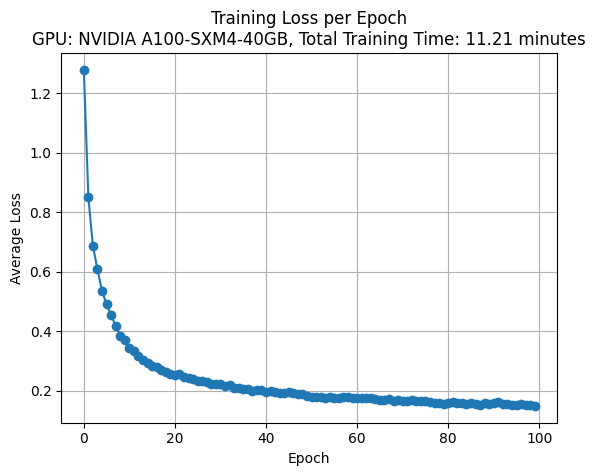

Chart saved to /content/drive/My Drive/ML_Class/Charts/100_20240530_234508/100_training_loss_20240530_234508.png


In [ ]:
# 保存模型的狀態字典
torch.save(model.state_dict(), model_save_path)
print(f"Model saved to {model_save_path}")

# 顯示並保存每個 epoch 的平均 loss 圖表
plt.figure()
plt.plot(range(num_epochs), losses_per_epoch, marker='o')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
plt.title(f'Training Loss per Epoch\nGPU: {gpu_name}, Total Training Time: {total_training_time/60:.2f} minutes')
plt.grid(True)
plt.savefig(chart_save_path)
plt.show()
print(f"Chart saved to {chart_save_path}")